In [1]:
%%HTML
<script src="require.js"></script>

from IPython.display import HTML
HTML(
    """
    <script
        src='https://cdnjs.cloudflare.com/ajax/libs/jquery/2.0.3/jquery.min.js'>
    </script>
    <script>
        code_show=true;
        function code_toggle() {
        if (code_show){
        $('div.jp-CodeCell > div.jp-Cell-inputWrapper').hide();
        } else {
        $('div.jp-CodeCell > div.jp-Cell-inputWrapper').show();
        }
        code_show = !code_show
        }
        $( document ).ready(code_toggle);
    </script>
    <form action='javascript:code_toggle()'>
        <input type="submit" value='Click here to toggle on/off the raw code.'>
    </form>
    """
)

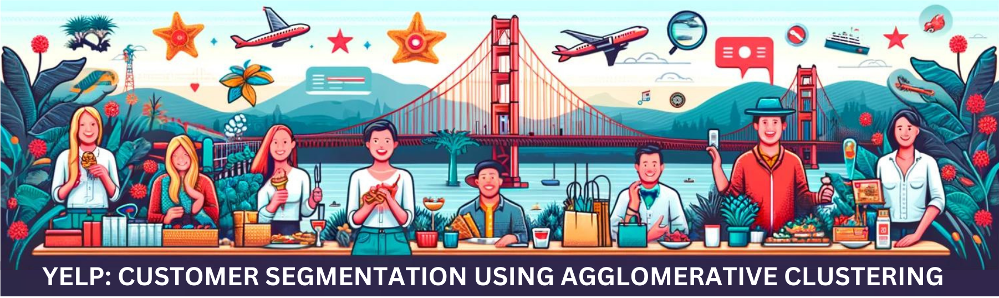

Yelp is a US based company founded in 2004 that hosts business information and crowd sourced reviews for businesses and customers to better find each other. They have been able to expand internationally in 2012 to Europe and Asia, and as of 2021 host 244.4 million reviews and 46 million unique visitors. 

Retrieved from (February 11, 2024): https://en.wikipedia.org/wiki/Yelp

#
<div style='display: flex; justify-content: space-between; align-items: center; background-color: #001f3f; color: white; padding: 6px; width: 100%;'>
    <h3 style='font-weight: bold; font-size: 25px;'>ABSTRACT</h3>
    <img src="Yelp-Logo-Refresh.gif" style='height: 55px; width: auto; margin-left: auto;'>
</div>

This project presents a comprehensive analysis of Yelp data from California, focusing on business and user reviews to understand clustering patterns. Utilizing a methodological framework that begins with the transformation of business tags into a numerical matrix via Count Vectorizer, we further streamline the data dimensionality through Non-negative Matrix Factorization (NMF). Subsequent clustering is achieved using Agglomerative Clustering with Ward's Linkage, identifying 13 distinct business categories. 

**The study extends to delineating user behavior by examining review frequencies across these business categories, enabling the classification of users into four clusters: Foodies, California Locals, Tourists, and General users.** The disparities in review patterns among these clusters are vividly depicted through heatmaps, highlighting their unique online engagement behaviors.

The choice of Count Vectorizer over TF-IDF was made to prioritize the raw frequency of word occurrences in business tags, capturing their direct popularity. Count Vectorizer straightforwardly reflects term presence, crucial for categorizing businesses based on tags. Unlike TF-IDF, which diminishes the weight of common terms, Count Vectorizer's simplicity ensures a transparent analysis, essential for identifying significant indicators of business categories. NMF was chosen for dimensionality reduction it imposes a non-negativity constraint on the data, meaning all components must be greater than or equal to zero. This constraint mirrors the inherent structure of text data, where the absence of negative word counts or frequencies naturally aligns with NMF's requirements, making the resulting components more interpretable as clusters or topics.

For clustering, Ward's Linkage was found to create meaningful clusters by minimizing within-cluster variance. The primary strength of Ward's linkage lies in its agglomerative hierarchical clustering approach, which iteratively merges clusters to minimize the within-cluster variance. This method ensures that the resulting clusters are as homogeneous as possible, making them more meaningful and easier to interpret. Ward's linkage is particularly suitable for datasets where the number of clusters is not known a priori, as it allows for the examination of cluster merges at different levels of the hierarchy to identify a natural grouping structure

The use of heatmaps for data visualization facilitates an intuitive understanding of complex patterns, enhancing interpretability. 

The findings of this study not only offer insights into consumer preferences and behavior but also underscore the business value of tailored marketing approaches, improved customer segmentation, and customized product or service offerings, ultimately aiming to boost customer satisfaction and business outcomes.

#
<div style='display: flex; justify-content: space-between; align-items: center; background-color: #001f3f; color: white; padding: 6px; width: 100%;'>
    <h3 style='font-weight: bold; font-size: 25px;'>PROBLEM STATEMENT</h3>
</div>

How can Yelp leverage its extensive database containing information on Businesses, Customers, and Reviews to gain deeper insights into customer behaviors and platform usage? The objective is to comprehend customer needs more effectively, enabling Yelp to tailor its services and offerings to meet the diverse requirements of its customer base more efficiently.

#
<div style='display: flex; justify-content: space-between; align-items: center; background-color: #001f3f; color: white; padding: 6px; width: 100%;'>
    <h3 style='font-weight: bold; font-size: 25px;'>MOTIVATION</h3>
</div>


Yelp operates within a competitive landscape as a platform for business advertising and reviews, facing challenges in servicing client businesses effectively. **The goal of the study is to identify user segments, offering Yelp valuable insights that can be used for focused marketing, tailored content, and strategic decision-making** and to demonstrate how decisions informed by data can boost user interaction and guide Yelp’s strategic choices, thus providing Yelp with a market advantage. Identifying these segments enables Yelp to better cater to its users' varied needs, leading to improved user experiences and more informed business strategies.

#
<div style='display: flex; justify-content: space-between; align-items: center; background-color: #001f3f; color: white; padding: 6px; width: 100%;'>
    <h3 style='font-weight: bold; font-size: 25px;'>METHODOLOGY OVERVIEW</h3>
</div>

The table below displays the methodology, which details the implementation plan of the study in order to answer the problem statement presented.

<center><b>Table 1. Methodology Overview</b></center>

| Stage                      | Step | Description                                                                                                         |
|-----------------------------------|----------|---------------------------------------------------------------------------------------------------------------------|
| Data Collection           |          | Retrieve files from Kaggle and load Yelp Businesses and Yelp User Reviews datasets.|
| Data Exploration           |          | Identify the column that will be used for the creation of bag-of-words matrix|
| Data Cleaning and Pre-processing           |          | Handle missing data and duplicates|
| Identify Business Clusters| I. Bag-of-Words| Using business tags, use CountVectorizer to create a bag-of-words matrix |
| | II. Dimensionality Reduction | Convert the BoW matrix to a dimension-reduced matrix using NMF, identifying the optimal number of components in the process  |
| | III. Agglomerative Clustering | Using the NMF matrix, identify the optimal distance threshold using Ward's Linkage and predict clusters |
| | IV. Label Business Clusters | Sample and analyze the cluster membership, and label the business clusters by their theme. |
| Identify User Clusters |I. Filter and Merge | Merge business cluster labels with the user reviews table.  |
| |II. Count User-Business Cluster Frequency | Create a pivot table that measures the count of reviews by user and business cluster.  |
| |III. Agglomerative Clustering | Using the pivot matrix, identify the optimal distance threshold using Ward's Linkage and predict clusters. |
| Cluster EDA |          | With the user clusters, interpret the results and label the user clusters                        |


#
<div style='display: flex; justify-content: space-between; align-items: center; background-color: #001f3f; color: white; padding: 6px; width: 100%;'>
    <h3 style='font-weight: bold; font-size: 25px;'>DATA OVERVIEW</h3>
</div>

The Yelp dataset features a curated selection of business, review, and user information from eight metropolitan areas across the USA and Canada, with this study specifically focusing on California.


Each monthly file name in the Customs Imports table contains the following columns.

<br>
<center> <b>Table 2. Yelp Business Dataset </b> </center>
<center>Source: yelp_academic_dataset_business.json</center>
<center>

| <center>Column Name</center> | <center>Description</center> | <center>Data Type</center> |
|:-----------------|:----------------------------------------------------------------------|:--------|
| business_id           | Unique Key of the table, identifier for a business | string |
| name    | Name of the business | string  |
| categories    | Tags describing the business, comma-separated and self-declared by the business | string  |
| state    | US state of business location | string  |
| ...    | Other columns include rating, longitude, latitude, ZIP Code, hours, etc. | Various  |


</center>


<br>
<br>
<center><b>Table 3. Yelp User Reviews </b></center>
<center>Source: yelp_reviews.txt</center>
<center>

| Column Name  | Description              | Data Type       |
|:-------------|:-------------------------|:----------------|
| user_id           | Identifier of the user providing the review.| string         |
| business_id      | Identifier of the business being reviewed.| string          |
| review_id  | Unique identifier of the review.| string |
| ...  | Other columns such as date, stars, funny, etc. | list of strings |

</center>


#
<div style='display: flex; justify-content: space-between; align-items: center; background-color: #001f3f; color: white; padding: 6px; width: 100%;'>
    <h3 style='font-weight: bold; font-size: 25px;'>EXECUTION</h3>
</div>

## 
<div style="background-color: #f0f0f0; padding: 10px;">
    <h2 style="color: navy;">A. Load Libraries and Custom Functions</h2>
</div>

The first step is loading libraries and functions that will be used to process, cluster, visualize, and analyze the data.

In [12]:
# Import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import plotly.graph_objects as go
from bs4 import BeautifulSoup
from collections import Counter
from scipy.cluster.hierarchy import dendrogram, fcluster, linkage
from scipy.spatial.distance import cityblock, euclidean
from sklearn.base import clone
from sklearn.cluster import (AgglomerativeClustering, DBSCAN, KMeans,
                             OPTICS, cluster_optics_dbscan)
from sklearn.decomposition import NMF, TruncatedSVD
from sklearn.feature_extraction.text import (CountVectorizer, TfidfVectorizer)
from sklearn.metrics import (adjusted_mutual_info_score, adjusted_rand_score,
                             calinski_harabasz_score, confusion_matrix,
                             davies_bouldin_score, silhouette_score)
from sklearn.neighbors import NearestNeighbors as knn
from matplotlib.colors import LinearSegmentedColormap
from IPython.display import HTML
!pip install fastcluster
import fastcluster

# Store custom functions
def top_terms_per_cat(V, top_n, feature_names_out):
    top_terms = []
    for topic in V:
        top_idx = topic.argsort()[-top_n:][::-1]
        terms = feature_names_out[top_idx]
        top_terms.append(terms)
    return top_terms


def reconstruction_error(n_components, lzd_bow_tfidf, title):
    errors = []
    for n_component in n_components:
        nmf_ = NMF(n_component, max_iter=1000)
        nmf_.fit(lzd_bow_tfidf)
        errors.append(nmf_.reconstruction_err_)
    plt.figure(figsize=(8, 4))
    plt.plot(n_components, errors, '-', color='#0E4C92', marker='.')
    plt.xticks(range(min(n_components), max(n_components) + 1, 2))
    plt.title(title)
    plt.xlabel(r'$n_{components}$')
    plt.ylabel('Reconstruction Error')
    plt.grid(axis='x', lw=0.5, alpha=0.5)
    plt.show();


def pooled_within_ssd(X, y, centroids, dist):
    Wk = sum(dist(x, centroids[i])**2 / (2*sum(y == i))
             for i in np.unique(y) for x in X[y == i])
    return Wk


def gen_realizations(X, b, random_state=None):
    mins = X.min(axis=0)
    maxs = X.max(axis=0)
    rng = np.random.default_rng(random_state)
    nrows, ncols = X.shape
    return rng.uniform(
        np.tile(mins, (b, nrows, 1)),
        np.tile(maxs, (b, nrows, 1)),
        size=(b, nrows, ncols),
    )


def gap_statistic(X, y, centroids, dist, b, clusterer, random_state=None):
    Wk = pooled_within_ssd(X, y, centroids, dist)
    X_refs = gen_realizations(X, b, random_state)
    Wk_i = [pooled_within_ssd(X_ref,
                              clusterer.fit_predict(X_ref), 
                              clusterer.cluster_centers_,
                              dist)
            for X_ref in X_refs]
    gs = sum(np.log(Wk_i) - np.log(Wk))/b
    gs_std = np.std(np.log(Wk_i) - np.log(Wk)) * (1+1/b)**0.5

    return gs, gs_std


def cluster_range(X, clusterer, k_start, k_stop):
    ys = []
    centers = []
    inertias = []
    chs = []
    scs = []
    dbs = []
    gss = []
    gssds = []
    for k in range(k_start, k_stop + 1):
        clusterer_k = clone(clusterer)
        clusterer_k.set_params(n_clusters=k)
        y = clusterer_k.fit_predict(X)
        ys.append(y)
        centers.append(clusterer_k.cluster_centers_)
        inertias.append(clusterer_k.inertia_)
        chs.append(calinski_harabasz_score(X, y))
        scs.append(silhouette_score(X,y))
        dbs.append(davies_bouldin_score(X,y))
        gs = gap_statistic(
            X,
            y,
            clusterer_k.cluster_centers_,
            euclidean,
            5,
            clone(clusterer).set_params(n_clusters=k),
            random_state=1337,
        )
        gss.append(gs[0])
        gssds.append(gs[1])

    res_dict = {'ys': ys,
                'centers': centers,
                'inertias': inertias,
                'chs': chs,
                'scs': scs,
                'dbs': dbs,
                'gss': gss,
                'gssds': gssds}

    return res_dict


def plot_3d(X_business_new, y_predict_means, kmeans_centroids=None):
    ''' Create a 3D scatter plot '''
    fig = go.Figure(data=[go.Scatter3d(
        x=X_business_new[:, 0], y=X_business_new[:, 1],
        z=X_business_new[:, 2], mode='markers',
        marker=dict(size=5, color=y_predict_means,
            opacity=0.8))])
    if kmeans_centroids is None:
        pass
    else:
        fig.add_trace(go.Scatter3d(
            x=kmeans_centroids[:, 0],
            y=kmeans_centroids[:, 1],
            z=kmeans_centroids[:, 2],
            mode='markers',
            marker=dict(size=10, color='black', symbol='x'
            )))

    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0), scene=dict(
                        xaxis_title='SVD1',
                        yaxis_title='SVD2',
                        zaxis_title='SVD3'))
    fig.show()


def other_hierarchical_method(data):
    linkage_methods = ['single', 'complete', 'average']
    fig, axes = plt.subplots(nrows=len(linkage_methods),
                             ncols=1, figsize=(10, 15))
    for i, method in enumerate(linkage_methods):
        Z = fastcluster.linkage(data, method=method)
        dendrogram(Z, truncate_mode='level', p=7, ax=axes[i])
        axes[i].set_ylabel(r"$\Delta$")
        axes[i].set_title(f"{method.capitalize()} Linkage")

    plt.tight_layout()
    plt.show()


def silhouette_score_plot(n_components, bow, title):
    silhouette_scores = []
    for n in n_components:
        nmf_ = NMF(n_components=n, max_iter=1000)
        W = nmf_.fit_transform(bow)
        cluster_labels = nmf_.transform(bow).argmax(axis=1)
        silhouette_avg = silhouette_score(bow, cluster_labels)
        silhouette_scores.append(silhouette_avg)
    max_score = max(silhouette_scores)

    plt.figure(figsize=(8, 4))
    plt.xlabel('Number of Components')
    plt.ylabel('Silhouette Score')
    plt.title(title)
    plt.grid(True, axis='x', linestyle='--', linewidth=0.5,
             alpha=0.5)
    plt.axvline(silhouette_scores.index(max_score)+2, c='r')
    plt.plot(n_components, silhouette_scores, '-',
             color='#0E4C92', marker='.')
    plt.show()


def customer_segment_heatmap(X, user_clusters, df_count_norm, cluster_names,
                             title):
    centroids = []
    for cluster in set(user_clusters):
        points_in_cluster = X[user_clusters == cluster]
        centroid = np.mean(points_in_cluster, axis=0)
        centroids.append(centroid)

    df_centroids = pd.DataFrame(
        data=centroids, columns=df_counts_norm.columns, index=cluster_names)
    df_normalized = df_centroids / df_centroids.max()

    white_green_cmap = LinearSegmentedColormap.from_list(
        'WhiteGreen', ['white', 'green'])
    plt.figure(figsize=(14, 3)) 
    heatmap = sns.heatmap(df_normalized, annot=True, cmap=white_green_cmap)
    heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=90)
    heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0)
    heatmap.set_xlabel('Business Cluster')
    heatmap.set_ylabel('User Cluster')
    heatmap.set_title(title)
    plt.show()

Defaulting to user installation because normal site-packages is not writeable


## 
<div style="background-color: #f0f0f0; padding: 10px;">
    <h2 style="color: navy;">B. Identifying Business Clusters</h2>
</div>

The next step is developing business clusters. The output of this step will be a list of business_ids and their associated cluster label.

The results of this stage is 13 distinct business clusters. These were clustered based on their values along 16 topics which were obtained from dimensionality reduction via NMF. 

The business clusters identified are:
* Travel
* Events
* Beauty
* Dental
* Medical
* Fitness
* Bar and Grill
* Tourism
* Restaurants
* Real Estate
* Pet Care
* Autos
* Home & Decor

### B.1 Data Exploration

The Yelp Business dataset has 150,346 listed businesses in USA and Canada.

In [13]:
df_business = pd.read_json('yelp_academic_dataset_business.json', lines=True)
df_business

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","1616 Chapala St, Ste 2",Santa Barbara,CA,93101,34.426679,-119.711197,5.0,7,0,{'ByAppointmentOnly': 'True'},"Doctors, Traditional Chinese Medicine, Naturop...",None
1,mpf3x-BjTdTEA3yCZrAYPw,The UPS Store,87 Grasso Plaza Shopping Center,Affton,MO,63123,38.551126,-90.335695,3.0,15,1,{'BusinessAcceptsCreditCards': 'True'},"Shipping Centers, Local Services, Notaries, Ma...","{'Monday': '0:0-0:0', 'Tuesday': '8:0-18:30', ..."
2,tUFrWirKiKi_TAnsVWINQQ,Target,5255 E Broadway Blvd,Tucson,AZ,85711,32.223236,-110.880452,3.5,22,0,"{'BikeParking': 'True', 'BusinessAcceptsCredit...","Department Stores, Shopping, Fashion, Home & G...","{'Monday': '8:0-22:0', 'Tuesday': '8:0-22:0', ..."
3,MTSW4McQd7CbVtyjqoe9mw,St Honore Pastries,935 Race St,Philadelphia,PA,19107,39.955505,-75.155564,4.0,80,1,"{'RestaurantsDelivery': 'False', 'OutdoorSeati...","Restaurants, Food, Bubble Tea, Coffee & Tea, B...","{'Monday': '7:0-20:0', 'Tuesday': '7:0-20:0', ..."
4,mWMc6_wTdE0EUBKIGXDVfA,Perkiomen Valley Brewery,101 Walnut St,Green Lane,PA,18054,40.338183,-75.471659,4.5,13,1,"{'BusinessAcceptsCreditCards': 'True', 'Wheelc...","Brewpubs, Breweries, Food","{'Wednesday': '14:0-22:0', 'Thursday': '16:0-2..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150341,IUQopTMmYQG-qRtBk-8QnA,Binh's Nails,3388 Gateway Blvd,Edmonton,AB,T6J 5H2,53.468419,-113.492054,3.0,13,1,"{'ByAppointmentOnly': 'False', 'RestaurantsPri...","Nail Salons, Beauty & Spas","{'Monday': '10:0-19:30', 'Tuesday': '10:0-19:3..."
150342,c8GjPIOTGVmIemT7j5_SyQ,Wild Birds Unlimited,2813 Bransford Ave,Nashville,TN,37204,36.115118,-86.766925,4.0,5,1,"{'BusinessAcceptsCreditCards': 'True', 'Restau...","Pets, Nurseries & Gardening, Pet Stores, Hobby...","{'Monday': '9:30-17:30', 'Tuesday': '9:30-17:3..."
150343,_QAMST-NrQobXduilWEqSw,Claire's Boutique,"6020 E 82nd St, Ste 46",Indianapolis,IN,46250,39.908707,-86.065088,3.5,8,1,"{'RestaurantsPriceRange2': '1', 'BusinessAccep...","Shopping, Jewelry, Piercing, Toy Stores, Beaut...",None
150344,mtGm22y5c2UHNXDFAjaPNw,Cyclery & Fitness Center,2472 Troy Rd,Edwardsville,IL,62025,38.782351,-89.950558,4.0,24,1,"{'BusinessParking': '{'garage': False, 'street...","Fitness/Exercise Equipment, Eyewear & Optician...","{'Monday': '9:0-20:0', 'Tuesday': '9:0-20:0', ..."


The "categories" column, contains 83,161 unique items, which will be transformed into a Bag-of-Words representation. This representation will then serve as the basis for agglomerative clustering.

In [14]:
len(df_business.categories.unique())

83161

### B.2 Data Cleaning and Pre-processing

The state field was filtered for California only.

In [15]:
df_business = df_business.loc[
    df_business.state == 'CA', ['business_id', 'name', 'categories']]
df_business[df_business.isnull().any(axis=1)]

,business_id,name,categories
50428,FbhbgFzX33w7qZctJJFA0g,Kennedy Accounting Systems,None


Removing data, "Kennedy Accounting Systems", with missing categories data is justified for clustering because categories are essential for determining the similarity between businesses. Without this information, the accuracy of clustering would be compromised.

In [16]:
df_business.dropna(inplace=True)

In [17]:
df_business.duplicated().sum()

0

No duplicate entries were found in the dataset, which makes it ready for the creation of a Bag of Words.

### B.3 Create Bag-of-Words Matrix

CountVectorizer was used to generate a Bag-of-Words matrix. For clustering short documents like the tags describing businesses, where each document contains only a few words or terms and the vocabulary is not expected to be very diverse, Count Vectorization is more suitable than TF-IDF. Moreover, there is more importance placed on presence of a word rather than frequency with CountVectorizer. Since each document has less than ten words, the frequency (beyond the binary presence or absence) offers limited additional insight for clustering. Additionally, tags describing a business are not dillutive in meaning. A restaurant which describes itself as both "Chinese" and "Spicy" is not less "Chinese" than a business which only describes itself as "Chinese" but not "Spicy". 

In [18]:
# Create BoW using CountVectorizer
vectorizer = CountVectorizer(token_pattern=r'[a-z-]+', stop_words='english')
bow = vectorizer.fit_transform(df_business.categories)
feature_names_out = vectorizer.get_feature_names_out()
bow_df = pd.DataFrame(bow.toarray(), columns=feature_names_out, index=df_business.categories)
bow_df.head()

,abatement,acai,accessories,accountants,acne,active,activities,acupuncture,addiction,adoption,...,wine,wineries,wings,women,workers,wraps,yelp,yoga,yogurt,zoos
categories,,,,,,,,,,,,,,,,,,,,,
"Doctors, Traditional Chinese Medicine, Naturopathic/Holistic, Acupuncture, Health & Medical, Nutritionists",0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
"Women's Clothing, Accessories, Children's Clothing, Men's Clothing, Adult, Shopping, Fashion",0,0,1,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,0,0,0
"Food, Restaurants, Salad, Coffee & Tea, Breakfast & Brunch, Sandwiches, Bakeries",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Towing, Automotive, Body Shops",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
"Parenting Classes, Maternity Wear, Fashion, Education, Specialty Schools, Local Services, Home Services, Laundry Services, Child Care & Day Care, Shopping, Baby Gear & Furniture",0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


### B.4 Dimensionality Reduction


Non-negative Matrix Factorization is performed to the Bag-of-Words generated to reduce the features to business categories that is prominent in California. NMF is chosen because of the following:

1. Sparse dataset: Count Vectorizer matrices are typically sparse, and NMF effectively maintains this sparsity, which is crucial for text data analysis. Conversely, PCA involves data centering by subtracting the mean, which can skew representation in sparse datasets where many values are zero, potentially failing to capture the principal components accurately.

2. Non-negativity constraint: NMF ensures that all factors maintain positive values leading to a parts-based representation. This is beneficial for CountVectorizer matrices of business categories, where each term or topic's positive influence enhances interpretability.

3. Topic extraction: NMF has been shown to be effective in extracting topics from text data. Since product names are textual in nature, NMF can capture latent topics that can help interpret the clusters that will be generated in clustering.

While Truncated SVD specifically LSA was considered as a valid method, the results were less interpretable (E.1.3 Other Dimensionality Reduction Methods), leading the team to choose NMF as the ideal dimensionality reduction method instead. A crucial step when conducting NMF is determing the appropriate or optimal number of components to split or group the words with. This is where metrics such as reconstruction error and silhouette score come in.

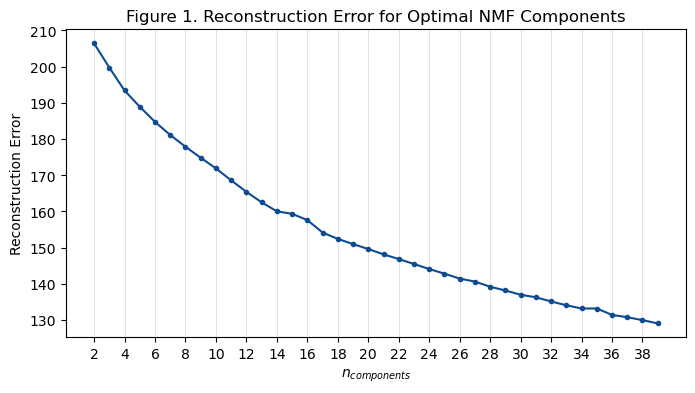

In [19]:
n_components = range(2, 40)
title = 'Figure 1. Reconstruction Error for Optimal NMF Components'
reconstruction_error(n_components, bow, title)

A lower reconstruction error can indicate a better approximate of the original dataset. By monitoring the reconstruction error, we can help ensure the dimensionality reduction does not sacrifice too much information. In Figure 1, the elbow point does not stand out immediately due to the gradual change on the reconstruction error.

Due to this, a secondary metric was used to better determine the optimal number of groups.

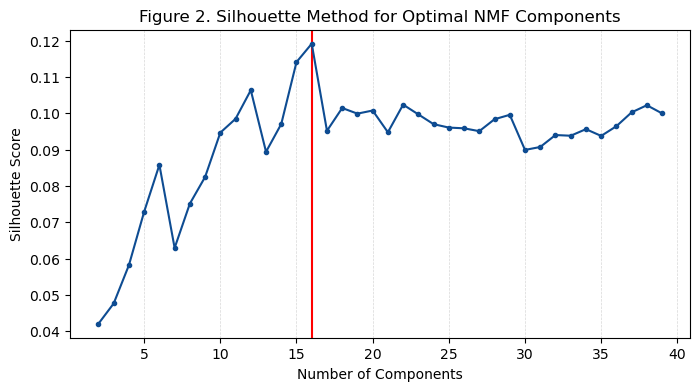

In [20]:
title = 'Figure 2. Silhouette Method for Optimal NMF Components'
silhouette_score_plot(n_components, bow, title)

The data presented in Figure 2 indicates that selecting 16 topics maximizes the silhouette score for NMF components. An optimal score of 0.12 suggests that the clusters are marginally distinguished from one another. This outcome aligns with the expectations set by the characteristics of the dataset, confirming that 16 is the optimal number of groups to minimize overlap of the topics.

In [21]:
# Dimensionality reduction with NMF
n_topics = 16
nmf = NMF(n_components=n_topics, max_iter=1000, random_state=42)
U = nmf.fit_transform(bow_df)
V = nmf.components_

# Display top terms per topic
top_terms = top_terms_per_cat(V, 10, feature_names_out)
indices = [f'Topic {i+1}' for i in range(n_topics)]
df_terms = pd.DataFrame(data=top_terms, index=indices)

print('Top Terms by Topic')
display(df_terms.T)

Top Terms by Topic


,Topic 1,Topic 2,Topic 3,Topic 4,Topic 5,Topic 6,Topic 7,Topic 8,Topic 9,Topic 10,Topic 11,Topic 12,Topic 13,Topic 14,Topic 15,Topic 16
0,services,food,hair,planning,medical,home,bars,shopping,tours,repair,life,estate,hotels,pet,arts,dentists
1,local,restaurants,spas,event,health,garden,restaurants,s,wine,auto,active,real,travel,pets,entertainment,medical
2,professional,tea,beauty,services,doctors,shopping,american,clothing,travel,automotive,fitness,services,services,services,wine,health
3,cleaning,coffee,salons,party,spas,stores,nightlife,fashion,hotels,stations,instruction,home,event,sitting,wineries,general
4,repair,specialty,removal,wedding,massage,installation,new,women,transportation,oil,gyms,agents,breakfast,groomers,beer,dentistry
5,laundry,grocery,skin,photography,medicine,decor,traditional,stores,limos,change,schools,apartments,planning,stores,spirits,cosmetic
6,printing,bakeries,care,venues,therapy,contractors,cocktail,accessories,rentals,car,trainers,management,bed,training,food,surgeons
7,home,desserts,waxing,spaces,centers,services,brunch,men,bus,supplies,education,property,transportation,veterinarians,tasting,oral
8,dry,fast,stylists,rentals,care,furniture,breakfast,jewelry,shuttles,parts,yoga,mortgage,rental,dog,bars,periodontists
9,financial,sandwiches,makeup,photographers,surgeons,kitchen,wine,goods,airport,tires,specialty,financial,vacation,walkers,room,orthodontists


### B.5 Agglomerative Clustering

Hierarchical clustering using **Ward's linkage** is particularly effective for text data, such as business tags, because it excels in handling high-dimensional spaces that are typical of text data. This method focuses on minimizing the total variance within clusters, which ensures that tags within the same cluster are closely related, even in a sparse and high-dimensional context. Such an approach is adept at uncovering nuanced similarities between tags, capturing deeper thematic or contextual links that might not be immediately apparent. This capability is crucial for text data, where semantic relationships are key, making hierarchical clustering with Ward's linkage a powerful tool for grouping business tags based on their underlying similarities. Additionally, this method does not require pre-specifying the number of clusters, which is beneficial for dealing with the often unknown and varied structure of document data. It produces a hierarchy of clusters that can be insightful for understanding the nuanced relationships between tags at different levels of granularity. Additionally, the dendrogram visualization aids in interpreting the clustering results, making it a comprehensive and intuitive approach for organizing and exploring document-based data.

#### B.5.1 Identify Threshold

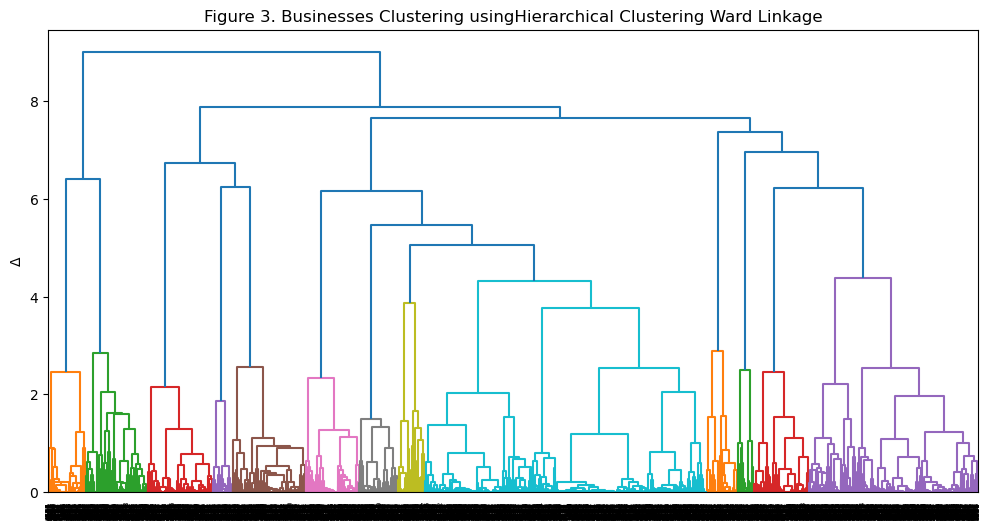

In [22]:
Z = fastcluster.linkage(U, method="ward")
fig, ax = plt.subplots(figsize=(12, 6))
dn = dendrogram(Z, ax=ax, color_threshold=5)
ax.set_ylabel(r"$\Delta$");
ax.set_title('Figure 3. Businesses Clustering using' 
             'Hierarchical Clustering Ward Linkage');

#### B.5.2 Label Business Clusters

In [23]:
labels = fcluster(Z, t=5, criterion="distance")
df_business['label'] = labels

business_samples = dict()
for i in set(labels):
    label_sample = list(df_business.name[df_business.label == i][0:10])
    business_samples[f'business cluster {i}'] = label_sample

df_business_samples = pd.DataFrame(business_samples)
df_business_samples

,business cluster 1,business cluster 2,business cluster 3,business cluster 4,business cluster 5,business cluster 6,business cluster 7,business cluster 8,business cluster 9,business cluster 10,business cluster 11,business cluster 12,business cluster 13
0,Enterprise Rent-A-Car,Weddings in Santa Barbara,805 Ink,"Michael W Thompson, DDS","Abby Rappoport, LAC, CMQ",Isla Vista Community Bike Center,California Tacos and Taproom,Enjoy The Mountain,H&M,Jessie Sessions - Berkshire Hathaway Santa Bar...,Cat Therapy,Iron Horse Auto Body,Tinkle Belle Diaper Service
1,"West Beach Inn, a Coast Hotel",The Adult Store,Hair By Audrey Johnson,"Lambeth Lyndon L, DDS","Dawna Ara, DACM, LAc",Surreal Virtual Reality Studio,China Bowl & State Street Cafe,Lama Dog Tap Room,Helena Avenue Bakery,CA Pro Home Inspection,Cat Doctors,A-1 Auto Repair,Prop and Decor Outlet: The Tent Merchant Inc.
2,Dustie Wagens,The Mill,Unique Tan,"Terrell F Pannkuk, MSCD",Ascending Health Juicery,Santa Barbara Athletic Club,Monty's,Dodo Limo & Transportation,Santa Barbara Shellfish Company,The Loop- Coastal Ridge,Aquatic Designs,Hugo's Auto Detailing,Challenge Asphalt Paving
3,Best Western Plus Pepper Tree Inn,Pour Santa Barbara,Star Nails,"Timothy P Mathis, DDS",Corazza Mark S MD,Run Montecito-Summerland,Padaro Beach Grill,Corks n' Crowns,Marty's Pizza,Bartlein & Co,Wency's Dog & Puppy Training,Granny's Garage,The UPS Store
4,La Maison Santa Barbara,Party Proper Productions,Cowboys and Angels Salon,Kubisch and Ferris Orthodontics,Sansum Clinic Obstetrics & Gynecology,Franceschi Park,Terraza Cafe,Santa Barbara Frame Shop & Gallery,Cal Taco,Pacific Crest Hotel Santa Barbara,B.U.N.S.,Carpinteria 76,Nancys Cleaning Services Of Santa Barbara
5,Carpinteria Shores,Imagine Weddings & Special Events,Benefit Cosmetics Boutique & BrowBar,"Kopelow Jeffrey S, DDS",Urban Optics Optometric Center,Los Padres National Forest,Islands Restaurant,Santa Barbara Airbus,Pho Bistro,Nico Pollero - Sotheby’s International Realty,Loose Pooch Dog Club,ATG Auto Repair,Hahka Kitchens
6,Sandpiper Lodge,Bella Vista Designs,"Carissa Cassone, LE",Arnett Gunson Facial Reconstruction,Santa Barbara Cryotherapy,Will Nelson Fitness,Barbarians,The Granada Theatre,Tienda Ho,Styled & Staged Santa Barbara,Mummys Day Off,Sears Auto Center,Upholstery Decor
7,Casa Del Mar Inn,Alegria By Design,The Barber Shop,"Lisa Beck-Uhl, DDS","Steven W. Pearson, MD",Santa Barbara Surf School,Montecito Wine Bistro,Rock Star Trolley,Rusty's Pizza Parlor,Preferred Rental Service,From The Heart Mobile Vet,Dalee Car Bath,Mission Appliance Service
8,Lyft,MICHAEL & ANNA COSTA PHOTOGRAPHY,Cloud Nine Treatments,"Gregg Welsh, Oral & Maxillofacial Surgery",Montecito Optometry,Elings Park,Cava Restaurant & Bar,Lucky Taxi & Limousine,Dune Coffee Roasters - Anacapa,Chase Bank,Veils & Tails Photography,Sport Cycle Pacific,Pier 1
9,Sandyland Reef Inn,Events By Rincon,Shear Artistry,"Clara G. Mora, DDS",Van Wickle Chiropractic,IMX Pilates Studio,The Project -- Corazón Cocina & Taproom,Deep Sea Tasting Room,Siam Elephant,Hollister Village,Santa Barbara Animal Medical Center,Beach Motor & Tires,Murphy Daniel A Atty


#### B.5.3 Produce Business ID and Business Cluster Mapping 

In [24]:
dict_labels = {
    1: 'Travel',
    2: 'Events',
    3: 'Beauty',
    4: 'Dental',
    5: 'Medical',
    6: 'Fitness',
    7: 'Bar and Grill',
    8: 'Tourism',
    9: 'Restaurants',
    10: 'Real Estate',
    11: 'Pet Care',
    12: 'Autos',
    13: 'Home & Decor',
}

df_business['label'] = df_business['label'].replace(dict_labels)

In [25]:
df_business.head(10)

,business_id,name,categories,label
0,Pns2l4eNsfO8kk83dixA6A,"Abby Rappoport, LAC, CMQ","Doctors, Traditional Chinese Medicine, Naturop...",Medical
26,noByYNtDLQAra9ccqxdfDw,H&M,"Women's Clothing, Accessories, Children's Clot...",Restaurants
85,IDtLPgUrqorrpqSLdfMhZQ,Helena Avenue Bakery,"Food, Restaurants, Salad, Coffee & Tea, Breakf...",Restaurants
91,nUqrF-h9S7myCcvNDecOvw,Iron Horse Auto Body,"Towing, Automotive, Body Shops",Autos
120,bYjnX_J1bHZob10DoSFkqQ,Tinkle Belle Diaper Service,"Parenting Classes, Maternity Wear, Fashion, Ed...",Home & Decor
141,SZU9c8V2GuREDN5KgyHFJw,Santa Barbara Shellfish Company,"Live/Raw Food, Restaurants, Seafood, Beer Bar,...",Restaurants
170,QZU7TcrztBb3tXaPbVCkXg,805 Ink,"Beauty & Spas, Tattoo",Beauty
219,25Uww0C0wvF9CZ_3B6vWtA,Enjoy The Mountain,"Motorcycle Rental, Tours, Hiking, Mountain Bik...",Tourism
227,xF9r1XbMvEOsJeHlmFhIvw,Weddings in Santa Barbara,"Professional Services, Officiants, Event Plann...",Events
401,4xhGQGdGqU60BIznBjqnuA,California Tacos and Taproom,"Mexican, Beer Bar, Bars, Sports Bars, Nightlif...",Bar and Grill


## 
<div style="background-color: #f0f0f0; padding: 10px;">
    <h2 style="color: navy;">C. Identifying User Clusters</h2>
</div

Using the Business ID and Business Cluster mapping from the previous stage, it is now possible to cluster users. Users leave reviews on individual businesses, however, once these businesses have been categorized, it is now possible to count the frequency of which a user reviews businesses of a particular category. This reveals his/her consumer habits. Whether or not these reviews are positive or negative is not relevant for the business problem of this project, as a person can be obsessed with Japanese cuisine but frequently leave negative reviews to Japanese restaurants due to having high standards. The important aspect is identifying the business categories that a user frequents.

### C.1 Data Exploration

In [26]:
df_user_reviews = pd.read_csv('yelp_reviews.txt')
df_user_reviews

,review_id,user_id,business_id,stars,useful,funny,cool,date
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3.0,0,0,0,2018-07-07 22:09:11
1,BiTunyQ73aT9WBnpR9DZGw,OyoGAe7OKpv6SyGZT5g77Q,7ATYjTIgM3jUlt4UM3IypQ,5.0,1,0,1,2012-01-03 15:28:18
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3.0,0,0,0,2014-02-05 20:30:30
3,AqPFMleE6RsU23_auESxiA,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,5.0,1,0,1,2015-01-04 00:01:03
4,Sx8TMOWLNuJBWer-0pcmoA,bcjbaE6dDog4jkNY91ncLQ,e4Vwtrqf-wpJfwesgvdgxQ,4.0,1,0,1,2017-01-14 20:54:15
...,...,...,...,...,...,...,...,...
6990275,H0RIamZu0B0Ei0P4aeh3sQ,qskILQ3k0I_qcCMI-k6_QQ,jals67o91gcrD4DC81Vk6w,5.0,1,2,1,2014-12-17 21:45:20
6990276,shTPgbgdwTHSuU67mGCmZQ,Zo0th2m8Ez4gLSbHftiQvg,2vLksaMmSEcGbjI5gywpZA,5.0,2,1,2,2021-03-31 16:55:10
6990277,YNfNhgZlaaCO5Q_YJR4rEw,mm6E4FbCMwJmb7kPDZ5v2Q,R1khUUxidqfaJmcpmGd4aw,4.0,1,0,0,2019-12-30 03:56:30
6990278,i-I4ZOhoX70Nw5H0FwrQUA,YwAMC-jvZ1fvEUum6QkEkw,Rr9kKArrMhSLVE9a53q-aA,5.0,1,0,0,2022-01-19 18:59:27


Yelp user review dataset has 6,990,280 reviews. It will be filtered to business_id in California.

### C.2 Data Cleaning and Preprocessing

#### C.2.1 Load Raw Data

In [27]:
df_user_reviews.isnull().any(axis=1).sum()

0

In [28]:
df_user_reviews.duplicated().sum()

0

The dataset has no null value and no duplicates.

In [29]:
n_rows = len(df_user_reviews)

print(f'Load User Yelp Reviews data')
display(df_user_reviews.head())
print(f'{n_rows} rows')

Load User Yelp Reviews data


,review_id,user_id,business_id,stars,useful,funny,cool,date
0,KU_O5udG6zpxOg-VcAEodg,mh_-eMZ6K5RLWhZyISBhwA,XQfwVwDr-v0ZS3_CbbE5Xw,3.0,0,0,0,2018-07-07 22:09:11
1,BiTunyQ73aT9WBnpR9DZGw,OyoGAe7OKpv6SyGZT5g77Q,7ATYjTIgM3jUlt4UM3IypQ,5.0,1,0,1,2012-01-03 15:28:18
2,saUsX_uimxRlCVr67Z4Jig,8g_iMtfSiwikVnbP2etR0A,YjUWPpI6HXG530lwP-fb2A,3.0,0,0,0,2014-02-05 20:30:30
3,AqPFMleE6RsU23_auESxiA,_7bHUi9Uuf5__HHc_Q8guQ,kxX2SOes4o-D3ZQBkiMRfA,5.0,1,0,1,2015-01-04 00:01:03
4,Sx8TMOWLNuJBWer-0pcmoA,bcjbaE6dDog4jkNY91ncLQ,e4Vwtrqf-wpJfwesgvdgxQ,4.0,1,0,1,2017-01-14 20:54:15


6990280 rows


#### C.2.2 Filter and Merge

In [30]:
# Filter for businesses in df_business 
df_user_reviews = df_user_reviews.loc[
    df_user_reviews['business_id'].isin(df_business.business_id),:]

# Filter for users with at least 5 reviews
user_counts = Counter(df_user_reviews.user_id)
filtered_user_ids = {
    user_id for user_id, count in user_counts.items() if count > 4}
df_user_reviews = df_user_reviews[
    df_user_reviews.user_id.isin(filtered_user_ids)]

# Filter for relevant columns
df_user_reviews = df_user_reviews.loc[:, ['user_id', 'business_id']]
n_rows = len(df_user_reviews)

# Merge business cluster labels
df_user_businessCluster = pd.merge(
    df_user_reviews, df_business[['business_id', 'label']],
    how='left', on='business_id')
df_user_businessCluster.rename(
    columns={'label': 'business_cluster'}, inplace=True)

df_user_businessCluster = df_user_businessCluster[
    ['user_id', 'business_cluster']]
display(df_user_businessCluster.head(5))
print(f'{n_rows} rows')

,user_id,business_cluster
0,59MxRhNVhU9MYndMkz0wtw,Restaurants
1,OhECKhQEexFypOMY6kypRw,Restaurants
2,4hBhtCSgoxkrFgHa4YAD-w,Restaurants
3,IMd3NQbclta91pFKk3AJZg,Home & Decor
4,UsBxLh14sUpO8SdeqIiGOA,Restaurants


146290 rows


#### C.2.3 Review Counts

In [31]:
# Get review count by business cluster 
df_counts = df_user_businessCluster.pivot_table(
    index='user_id', columns='business_cluster',
    aggfunc='size', fill_value=0)
df_counts.columns.name = None
df_counts.reset_index(drop=True, inplace=True)
df_counts_norm = df_counts.div(df_counts.sum(axis=1), axis=0)

print("Review Count by Business Cluster, Normalized per User")
df_counts_norm

Review Count by Business Cluster, Normalized per User


,Autos,Bar and Grill,Beauty,Dental,Events,Fitness,Home & Decor,Medical,Pet Care,Real Estate,Restaurants,Tourism,Travel
0,0.0,0.333333,0.000000,0.0,0.000000,0.0,0.00,0.166667,0.0,0.0,0.333333,0.166667,0.0
1,0.0,0.000000,0.333333,0.0,0.000000,0.0,0.00,0.000000,0.0,0.0,0.666667,0.000000,0.0
2,0.0,0.000000,0.062500,0.0,0.062500,0.0,0.25,0.000000,0.0,0.0,0.625000,0.000000,0.0
3,0.0,0.222222,0.000000,0.0,0.000000,0.0,0.00,0.000000,0.0,0.0,0.777778,0.000000,0.0
4,0.0,0.000000,0.000000,0.0,0.400000,0.0,0.00,0.000000,0.0,0.0,0.600000,0.000000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
12737,0.0,0.285714,0.000000,0.0,0.142857,0.0,0.00,0.000000,0.0,0.0,0.571429,0.000000,0.0
12738,0.2,0.200000,0.200000,0.0,0.000000,0.0,0.20,0.000000,0.0,0.0,0.200000,0.000000,0.0
12739,0.0,0.000000,0.400000,0.0,0.000000,0.0,0.20,0.000000,0.0,0.0,0.400000,0.000000,0.0
12740,0.0,0.000000,0.200000,0.0,0.000000,0.0,0.00,0.000000,0.0,0.0,0.800000,0.000000,0.0


### C.3 Agglomerative Clustering

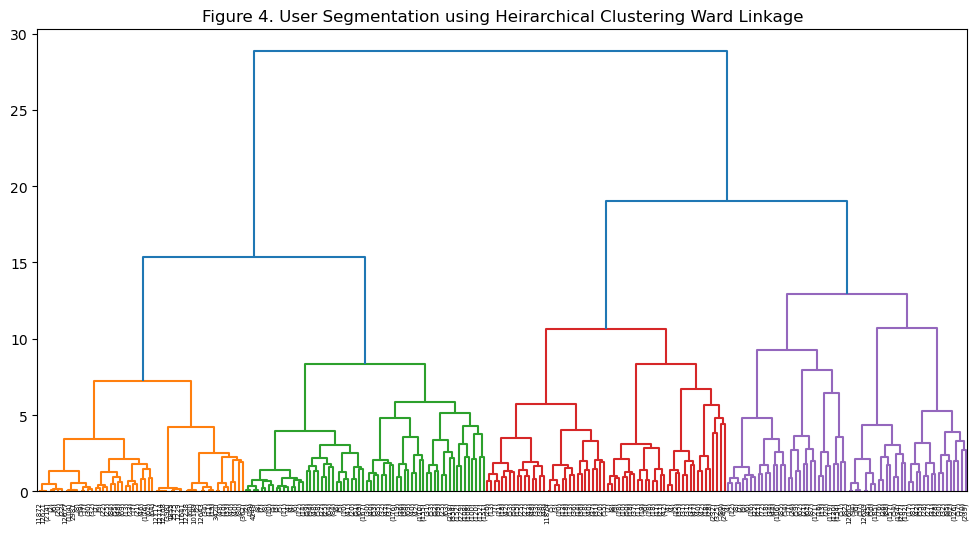

In [32]:
X = df_counts_norm.values
Z = fastcluster.linkage(X, method="ward")
fig, ax = plt.subplots(figsize=(12, 6))
ax.set_title('Figure 4. User Segmentation using '
             'Heirarchical Clustering Ward Linkage')
dn = dendrogram(Z, truncate_mode='level', p=7, ax=ax, color_threshold=14)

In [33]:
user_clusters = fcluster(Z, t=14, criterion='distance')
print(f'Unique Users: {len(user_clusters)}')

Unique Users: 12742


## 
<div style="background-color: #f0f0f0; padding: 10px;">
    <h2 style="color: navy;">D. User Cluster Exploratory Data Analysis</h2>
</div

### D.1 Heatmap Analysis

##### **Results and Discussion**

In the process below, the mean centroids of each user cluster were taken. These representatives describe the generalized tendency of users in that cluster to leave reviews in one business category relative to others. 

The four user clusters displayed unique tendencies that contrast with other clusters:
* User Cluster 0 (Foodies) - Displays a strong tendency to review restaurants over all other business categories
* User Cluster 1 (General) - Does not display any strong tendency to review a particular business category over the rest.
* User Cluster 2 (Locals) - These users tend to review businesses that are strongly relevant to local residents, such as pet care, home & decor, dental services, and medical services. 
* User Cluster 3 (Tourists) - These users display strong contrast with Locals in that they are unlikely to review the businesses that Locals review and vice versa. Instead, Tourists tend to review businesses related to tourism, travel services, events, and bars.

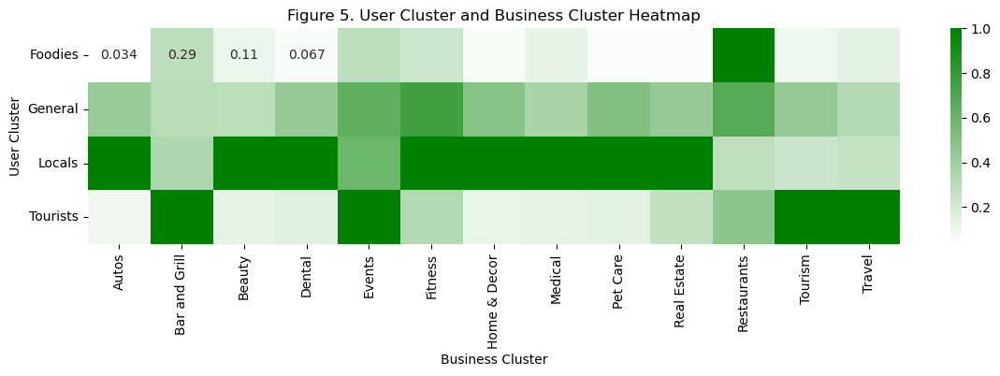

In [34]:
cluster_names = ['Foodies', 'General', 'Locals', 'Tourists']
title = 'Figure 5. User Cluster and Business Cluster Heatmap'
customer_segment_heatmap(X, user_clusters, df_counts_norm, cluster_names, title)

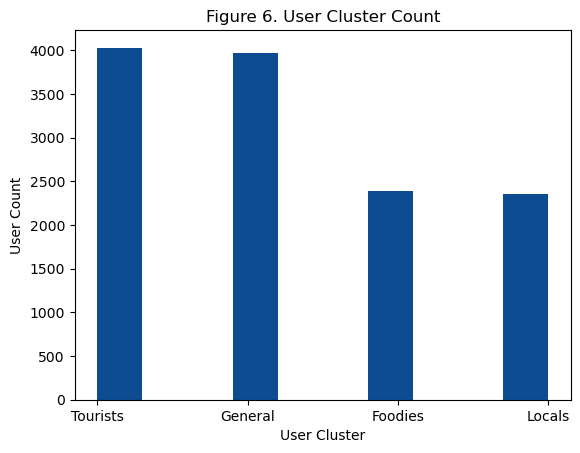

In [35]:
user_clusters_with_names = [cluster_names[i-1] for i in user_clusters]
plt.hist(user_clusters_with_names, color='#0E4C92')
plt.title('Figure 6. User Cluster Count')
plt.xlabel('User Cluster')
plt.ylabel('User Count')
plt.show()

In Figure 6, the 'Tourists' and 'General' are the most populous user clusters, indicating a wide range of interests, while 'Foodies' and 'Locals' have fewer users, suggesting more specialized interests. This information can be used to tailor marketing strategies, product development, and customer experience initiatives.

### D.2 SVD Projection with Ward's Linkage Method

The clusters below, while not capturing all dimensions, does demonstrate that the distribution of users are non-globular. Consequently, although there appears to be regions where certain clusters are more prevalent, the overall shape would cause internal validatoin statistics such as the Sihouette score to be underwhelming. This is why the heatmap was this project's primary visualization to display the variances between the clusters. 

<h2 style="text-align: center; font-size: 18px;">Figure 7. User Clustering Using Ward's Linkage Method - 3D SVD Plot</h2>

In [36]:
customer_svd = TruncatedSVD(n_components=3, random_state=1337)
X_customer_new = customer_svd.fit_transform(df_counts_norm.values)
plot_3d(X_customer_new, user_clusters)

#
<div style='display: flex; justify-content: space-between; align-items: center; background-color: #001f3f; color: white; padding: 6px; width: 100%;'>
    <h3 style='font-weight: bold; font-size: 25px;'>CONCLUSION</h3>
 <img src="Yelp-Logo-Refresh.gif" style='height: 55px; width: auto; margin-left: auto;'>
</div>

The project's success and its inherent business value stem from its ability to delineate significant variances in user review behaviors across different business categories, as evidenced by the heatmap analysis. This differentiation enables targeted marketing, refined customer segmentation, and informed product development, aligning offerings with specific user preferences. Such insights facilitate strategic business planning, allowing for resource optimization and enhanced customer engagement strategies. Moreover, the nuanced understanding of diverse user clusters—ranging from Foodies to Tourists—provides businesses with a competitive advantage, enabling Yelp to tailor experiences, stand out in the market, and attract a wider or more focused customer base. Ultimately, the project underscores the importance of data-driven decisions in enhancing customer satisfaction and driving business growth.

Internal validation metrics like the Silhouette Score were not emphasized due to the specific characteristics and goals of analyzing Yelp data. The complex nature of user behaviors and business categories in the dataset means that the Silhouette Score, which evaluates cluster separation and cohesion, might not effectively capture the quality of clusters. The project aimed to derive meaningful, interpretative insights rather than purely quantitative assessments of cluster quality. Additionally, the use of Ward's linkage, a hierarchical clustering method, focused on exploring data structure and relationships over optimizing a numerical score. The primary objective was to gain domain-specific understanding from the data, making the interpretability and insights derived from clusters more valuable than the strict mathematical validation provided by metrics like the Silhouette Score.

Utilizing agglomerative clustering with Ward's linkage to analyze user review data would allow Yelp to discern significant patterns and segments within their customer base. This approach facilitates more strategic decision-making and improves customer experiences by revealing underlying user behaviors and preferences.

Companies such as Yelp accumulate vast amounts of data, yet the true value of this data is realized only when it can be analyzed for insights or utilized in practical applications. Through the use of agglomerative clustering, we can transform Yelp's review and business data into valuable insights regarding user behavior and app usage patterns. This analysis has identified four distinct user clusters:

* Foodies: Predominantly uses Yelp for exploring restaurants, showing little interest in other types of businesses. Targeting this segment specifically for restaurant-related content could enhance click-through rates and the advertising appeal for dining establishments.

* California Locals: Engages with the app to discover services and goods within their immediate area, suggesting that advertisements and recommendations for these businesses should be geographically targeted to reach these users effectively.

* Tourists: Characterized by their searches for travel-related services and entertainment options far from their home locations, tourists represent a segment that could benefit from tailored marketing strategies to improve engagement and meet their specific needs.

* Generalz Users: the most diverse group and utilizes Yelp for a wide range of services. Although challenging to categorize based on a single interest, their broad engagement suggests they are likely the most active users. Offering them a wide array of advertisements could potentially cater to their varied interests.

It is important to note that user segmentation through clustering has its limitations, primarily due to the predictive challenges and potential inaccuracies inherent in analyzing self-reported, human-generated data. Despite these challenges, analyzing large datasets enables us to gain significant insights into user preferences and behaviors. By integrating user location data with their historical activities and reviews, we can significantly increase the likelihood of delivering recommendations and advertisements that users will find genuinely appealing.

Deeper insights are yet to be uncovered. It is possible that sub-clusters were not adequately explored. This would involve subsetting the data further to analyze how a cluster  might be broken down further. This would further refine the clustering into more specific groups, offering more detailed insight on how user behavior and interests might vary.

#
<div style='display: flex; justify-content: space-between; align-items: center; background-color: #001f3f; color: white; padding: 6px; width: 100%;'>
    <h3 style='font-weight: bold; font-size: 25px;'>APPENDIX</h3>
</div>

### E.1 Businesses Clustering

#### E.1.1 Hierarchical Clustering (Ward Method)

<h2 style="text-align: center; font-size: 16px;">Figure 8. Business Clustering Using Ward's Linkage Method - 3D SVD Plot</h2>

In [37]:
business_svd = TruncatedSVD(n_components=100, random_state=1337)
X_business_new = business_svd.fit_transform(bow)
plot_3d(X_business_new, labels)

The results of the Ward Method applied to the Yelp business dataset are illustrated in Figure 8. This plot demonstrates characteristics of effective clustering, including compactness and proximity of data points within the same cluster. Overlaps observed in the plot are typical for the business domain, indicating that certain entities may be categorized into more than one business type. This overlap is minimized when the number of categories is 13.

#### E.1.2 Other Hierarchical Clustering Methods

Other linkage methods of agglomerative clustering were considered but ultimately rejected due to their inability to effectively cluster. The dendrogram plots below illustrate the lack of sudden jumps in distances which would otherwise indicate separation between clusters. 

<h2 style="text-align: center; font-size: 16px;">Figure 9. Business Clustering using Other Heirarchical Clustering Methods</h2>

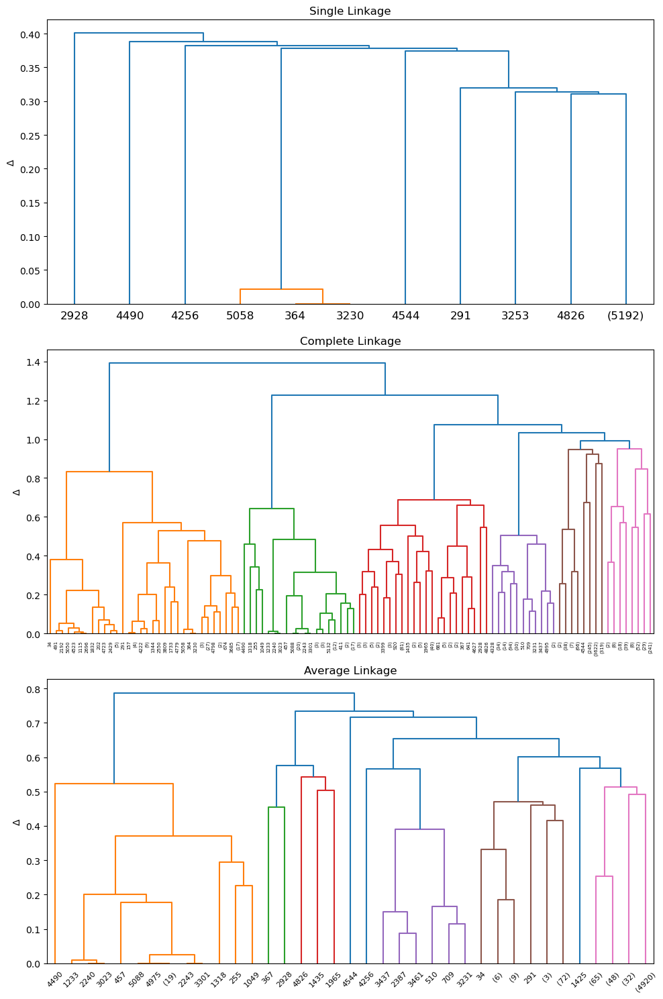

In [38]:
other_hierarchical_method(U)

#### E.1.3 Other Dimensionality Reduction Methods

Before performing clustering methods, LSA's dimensionality reduction was performed to reduce the number of features that will be fed into the clustering process. This step not only saves computation time but also ensures that the dataset is represented efficiently.

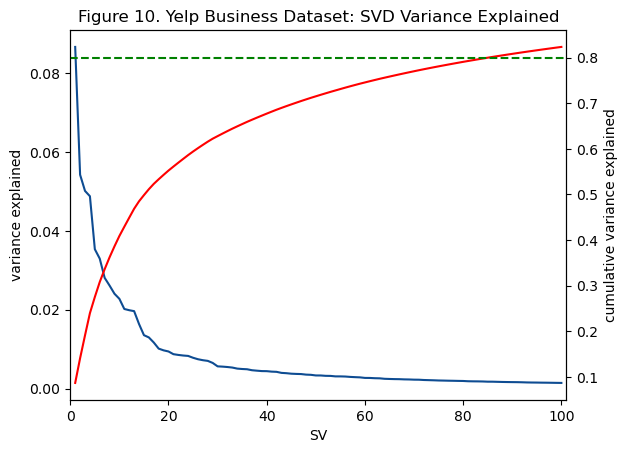

In [39]:
variance_explained = business_svd.explained_variance_ratio_
cumulative_variance_explained = variance_explained.cumsum()

fig, ax = plt.subplots()
ax.plot(range(1, len(variance_explained) + 1),
        variance_explained, '-', color='#0E4C92',
        label='individual')
ax.set_xlim(0, len(variance_explained) + 1)
ax.set_xlabel('SV')
ax.set_ylabel('variance explained')
ax = ax.twinx()
ax.plot(range(1, len(variance_explained) + 1),
        cumulative_variance_explained,
        'r-', label='cumulative')
ax.axhline(0.8, ls='--', color='g')
ax.set_ylabel('cumulative variance explained')
ax.set_title('Figure 10. Yelp Business Dataset: SVD Variance Explained');

In [40]:
num_svd_80_var = (cumulative_variance_explained<0.8).sum()+1
print('The ideal number of SVD to use is', num_svd_80_var)

The ideal number of SVD to use is 85


In [41]:
business_svd = TruncatedSVD(n_components=num_svd_80_var, random_state=1337)
X_business_new = business_svd.fit_transform(bow)

Singular Value Decomposition requires 85 features to explain 80% of the variance, making it significantly more complex to interpret and consequently use to cluster businesses than the mere 16 topic generated by Non-negative Matrix Factorization.

#### E.1.4 Representative Clustering Method: k-Means

For representative clustering methods, K-means was chosen due to the following reasons:

- K-means offers computational efficiency, which is advantageous for Yelp business dataset which is a large datasets.
- The preprocessing step with NMF helps in creating a feature space that is more amenable to clustering by K-means, by emphasizing key topics and potentially diminishing the influence of outliers and noise.
- The objective is to identify clusters of business categories, for which K-means is a suitable method given its focus on finding central points (means) around which to form clusters.

In [42]:
res_data = cluster_range(
    U, KMeans(random_state=1337, n_init="auto"), 2, 31)

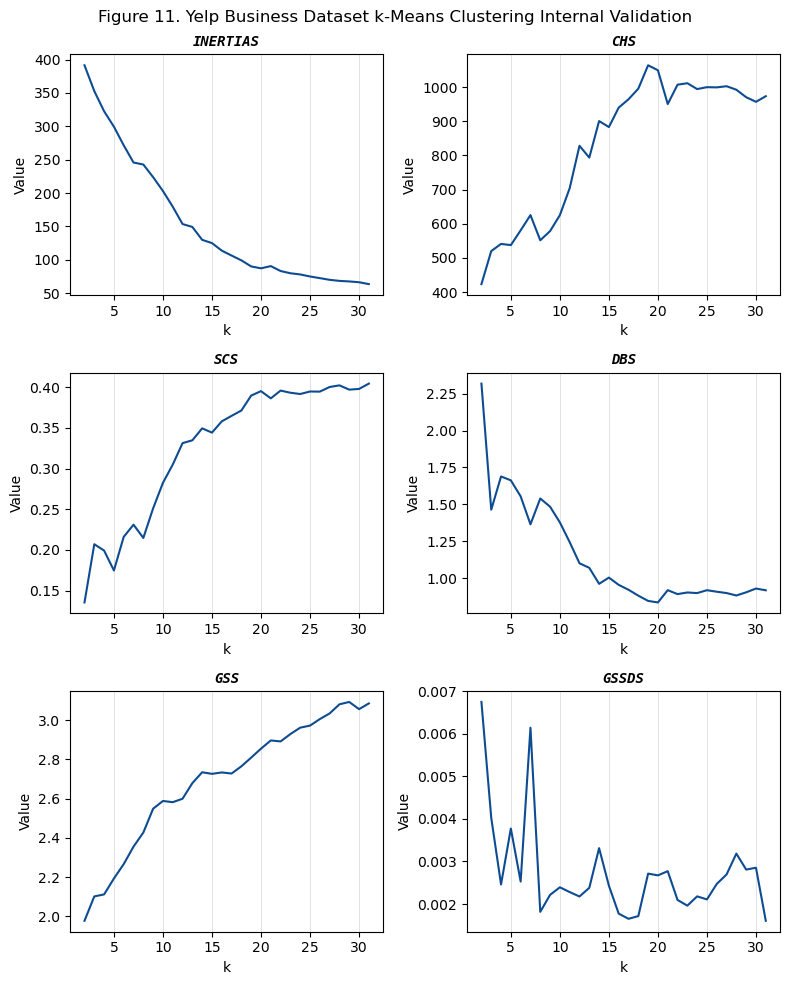

In [43]:
df_business_intval = pd.DataFrame(res_data, columns=res_data.keys())
df_business_intval = df_business_intval.drop(['centers', 'ys'], axis=1)

font1 = {'family': 'monospace', 'weight': 'bold',
         'style': 'italic', 'size' :10}
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(8, 10))
plt.suptitle('Figure 11. Yelp Business Dataset k-Means Clustering '
             'Internal Validation',
             fontdict={'size':100})
plt.subplots_adjust(hspace=0.3, wspace=0.3)
i = 0
for column_name in df_business_intval.columns:
    i += 1
    plt.subplot(3, 2, i)
    plt.title(df_business_intval.columns[i-1].upper(), fontdict=font1)
    plt.xlabel('k')
    plt.ylabel('Value', labelpad=None)
    plt.plot(range(2, len(df_business_intval)+2),
             df_business_intval[df_business_intval.columns[i-1]],
             color='#0E4C92')
    plt.grid(axis='x', lw=0.5, alpha=0.5)
    plt.tight_layout()
plt.show()

The internal validation results are as follows:

- SSE (Sum of Squared Errors) shows elbow point at 19.
- CHS (Calinski-Harabasz Score) is at 19.
- SCS (Silhouette Coefficient Score) is at 31.
- DBS (Davies-Bouldin Score) is 19 or 20.
- GSS (Gap Statistic Score) is 29 which is the highest score before the drop.

The number of clusters that can be determined from the internal validation is 19. Therefore, 19 clusters will be used.

In [44]:
med_business = KMeans(n_clusters= 19, random_state=1337, n_init="auto")
y_predict_means = med_business.fit_predict(U)
kmeans_centroids = med_business.cluster_centers_

<h2 style="text-align: center; font-size: 18px;">Figure 12. Business Clustering Using k-Means Clustering - 3D SVD Plot</h2>

In [45]:
plot_3d(X_business_new, y_predict_means, kmeans_centroids=kmeans_centroids)

In [46]:
df_business['label'] = y_predict_means

business_samples = dict()
for i in set(y_predict_means):
    label_sample = list(df_business.name[df_business.label == i][0:10])
    business_samples[f'business cluster {i}'] = label_sample

df_business_samples = pd.DataFrame(business_samples)
df_business_samples.head()

,business cluster 0,business cluster 1,business cluster 2,business cluster 3,business cluster 4,business cluster 5,business cluster 6,business cluster 7,business cluster 8,business cluster 9,business cluster 10,business cluster 11,business cluster 12,business cluster 13,business cluster 14,business cluster 15,business cluster 16,business cluster 17,business cluster 18
0,A-1 Auto Repair,Iron Horse Auto Body,California Tacos and Taproom,Isla Vista Community Bike Center,Tinkle Belle Diaper Service,Helena Avenue Bakery,Bella Vista Designs,Hair By Audrey Johnson,"Abby Rappoport, LAC, CMQ",Enterprise Rent-A-Car,Cat Therapy,Jessie Sessions - Berkshire Hathaway Santa Bar...,Bartlein & Co,"Michael W Thompson, DDS",Weddings in Santa Barbara,Enjoy The Mountain,Lama Dog Tap Room,H&M,Prop and Decor Outlet: The Tent Merchant Inc.
1,Hugo's Auto Detailing,805 Ink,Cal Taco,Surreal Virtual Reality Studio,The UPS Store,Santa Barbara Shellfish Company,Alegria By Design,Unique Tan,"Dawna Ara, DACM, LAc","West Beach Inn, a Coast Hotel",Wency's Dog & Puppy Training,CA Pro Home Inspection,Chase Bank,"Lambeth Lyndon L, DDS",Bogo SB,Dustie Wagens,The Adult Store,Tienda Ho,Hahka Kitchens
2,Granny's Garage,Marty's Pizza,China Bowl & State Street Cafe,Santa Barbara Athletic Club,Nancys Cleaning Services Of Santa Barbara,Pho Bistro,Events By Rincon,Star Nails,Ascending Health Juicery,Best Western Plus Pepper Tree Inn,Loose Pooch Dog Club,The Loop- Coastal Ridge,Hollister Village,"Timothy P Mathis, DDS",Pour Santa Barbara,Dodo Limo & Transportation,California Wine Festival,Gap,Upholstery Decor
3,ATG Auto Repair,Rusty's Pizza Parlor,Monty's,Run Montecito-Summerland,Milpas Rental,Dune Coffee Roasters - Anacapa,Barbara Rose Sherman,Cowboys and Angels Salon,Corazza Mark S MD,La Maison Santa Barbara,Mummys Day Off,Nico Pollero - Sotheby’s International Realty,La Cumbre Management,Kubisch and Ferris Orthodontics,Party Proper Productions,Santa Barbara Airbus,The Mill,LF Santa Barbara,Mission Appliance Service
4,Sears Auto Center,Challenge Asphalt Paving,Padaro Beach Grill,Franceschi Park,Vera Kong Piano Studio,Pieology Pizzeria,Gavin Roy Presents,Benefit Cosmetics Boutique & BrowBar,Sansum Clinic Obstetrics & Gynecology,Carpinteria Shores,Veils & Tails Photography,Styled & Staged Santa Barbara,Escalera Pest Control,"Kopelow Jeffrey S, DDS",Imagine Weddings & Special Events,Rock Star Trolley,El Presidio de Santa Bárbara State Historic Park,Hempwise,Pier 1


Based on the structure of the data presented in the table above, the business categories that represent the businesses are:

| Cluster Name                              | Description                                                      |
|:------------------------------------------|:-----------------------------------------------------------------|
| Auto Services                     | Includes businesses related to auto repair and detailing.        |
| Personal Services                 | Might consist of services like tattooing and auto body services. |
| Food and Drink                    | Focuses on eateries and cafes.                                   |
| Community and Recreation          | Includes community services and recreational activities.         |
| Professional Services             | Offer various professional services.                             |
| Gourmet and Dining                | Contains bakeries and restaurants.                               |
| Event Planning and Design         | Is related to event planning and interior design.                |
| Beauty and Wellness               | Focuses on beauty salons and wellness services.                  |
| Health and Wellness               | Includes health practitioners.                                   |
| Travel and Accommodation          | Is related to rentals and hotels.                                |
| Pet Services                      | Offers pet-related services.                                     |
| Real Estate and Inspection        | About real estate and home inspection services.                  |
| Financial and Management Services | Involves banking and property management.                        |
| Dental Services                   | Focuses on dental services.                                      |
| Wedding and Event Services        | Includes wedding planning and event services.                    |
| Outdoor and Recreation            | About outdoor activities and transportation.                     |
| Retail and Festival               | Combines retail shops with festival experiences.                 |
| Fashion and Apparel               | Related to clothing and fashion retail.                          |
| Home and Decor                    | Focuses on home decor and furniture.                             |


However, the current categorization reveals significant overlap; for instance, the 'Beauty and Wellness' and 'Health and Wellness' clusters essentially represent the same business type. Similarly, the 'Food and Drink' and 'Gourmet and Dining' clusters both focus on food-related businesses. This overlap suggests that the hierarchical clustering ward method, which successfully identified just 13 distinct clusters, yields better results in minimizing such redundancies.

#### E.1.4 Density-based Clustering: OPTICS

For density-based clustering, OPTICS was chosen over DBSCAN due to its ability to handle clusters of varying densities which is evident in business dataset plot.

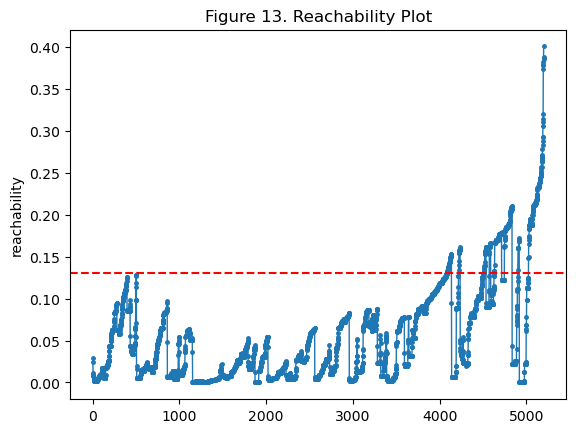

Number of clusters: 8
Number of noise points: 477
Number of points in the largest cluster: 4082
Number of points: 5202


In [47]:
eps_business = 0.13
optics = OPTICS(min_samples=2*U.shape[1], cluster_method="dbscan")
optics.fit(U)
y_predict_optics = cluster_optics_dbscan(
    reachability=optics.reachability_,
    core_distances=optics.core_distances_,
    ordering=optics.ordering_,
    eps=eps_business)
plt.plot(optics.reachability_[optics.ordering_],
         ".-", label='reachability', ms=5, lw=1)
plt.axhline(y=eps_business, c='r', linestyle='--')
plt.ylabel("reachability");
plt.title("Figure 13. Reachability Plot")
plt.show()
print("Number of clusters:", y_predict_optics.max() + 1)
print("Number of noise points:", (y_predict_optics == -1).sum())
print("Number of points in the largest cluster:",
      np.bincount(y_predict_optics[y_predict_optics >= 0]).max(),
)
print("Number of points:", len(y_predict_optics))

The OPTICS reachability plot revealed significant noise involving 477 businesses, which undermines the objective of categorizing each business in the Yelp dataset effectively. Therefore, this method was not used.

### E.2 User Segmentation

#### E.2.1 Other Hierarchical Clustering Methods

<h2 style="text-align: center; font-size: 16px;">Figure 14. User Segmentation using Other Heirarchical Clustering Methods</h2>

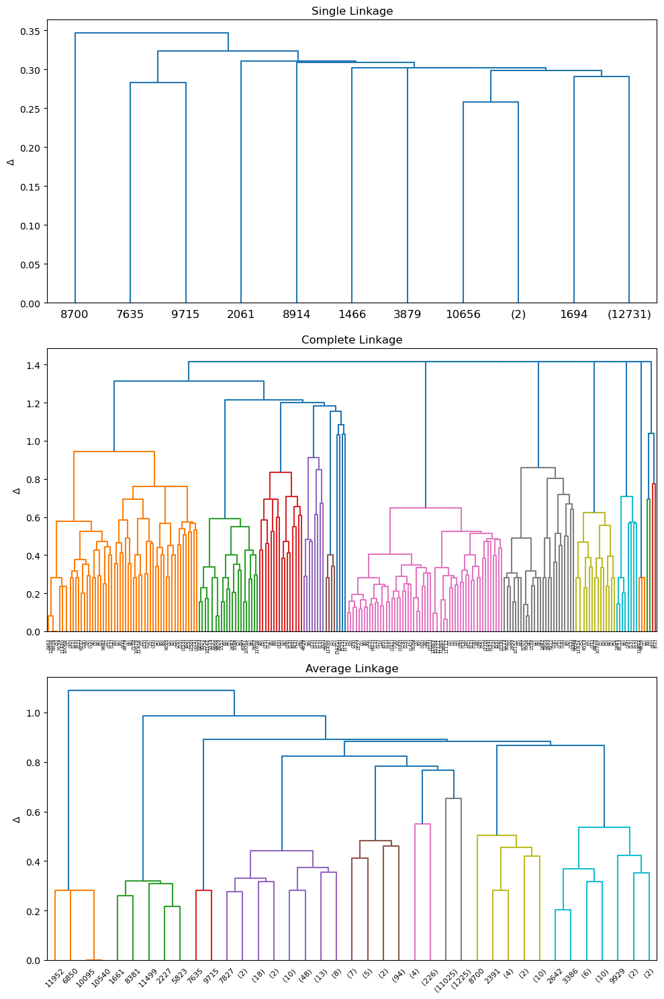

In [48]:
other_hierarchical_method(X)

Using alternative clustering methods, both complete and average linkage produced satisfactory clustering, as evidenced by the dendrogram; however, the most significant gap was predominantly observed when employing the Ward method. Moreover, Ward's method resulted in a more balanced distribution of customers across segments, in contrast to the results presented in Figure 14.

#### E.2.1 Representative Clustering Method: k-Means

In [49]:
res_data = cluster_range(
    X, KMeans(random_state=1337, n_init="auto"), 2, 16)

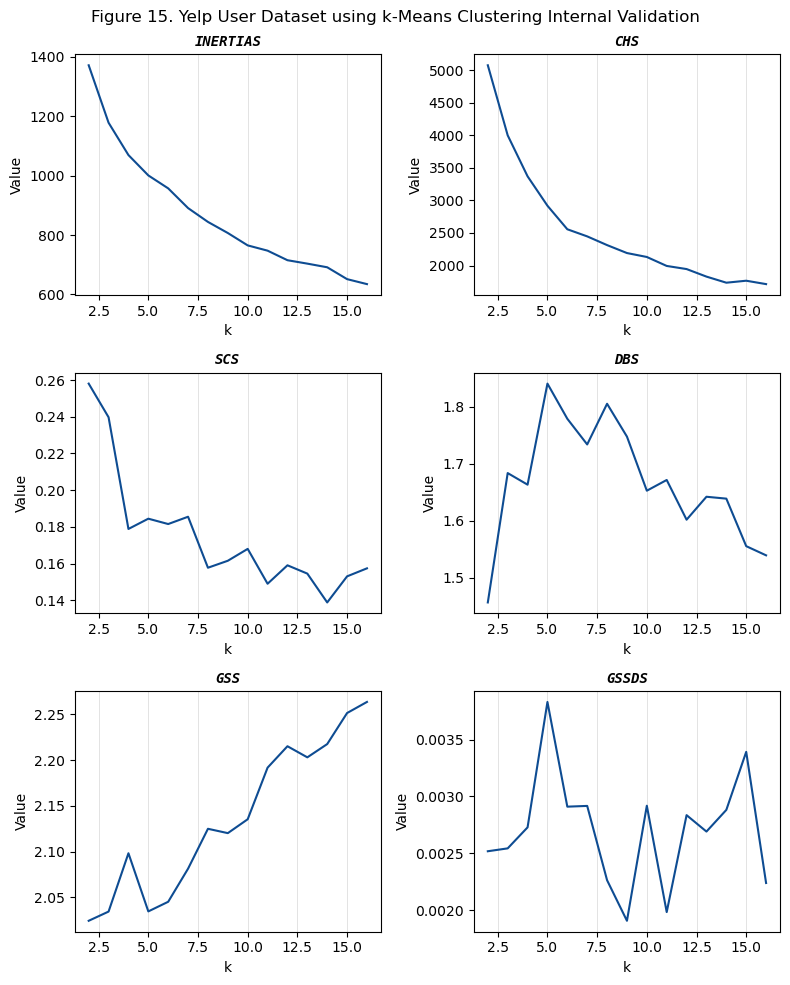

In [50]:
df_user_intval = pd.DataFrame(res_data, columns=res_data.keys())
df_user_intval = df_user_intval.drop(['centers', 'ys'], axis=1)

font1 = {'family': 'monospace', 'weight': 'bold',
         'style': 'italic', 'size' :10}
fig, axes = plt.subplots(nrows=3, ncols=2, figsize=(8, 10))
plt.suptitle('Figure 15. Yelp User Dataset using k-Means Clustering '
             'Internal Validation',
             fontdict={'size':100})
plt.subplots_adjust(hspace=0.3, wspace=0.3)
i = 0
for column_name in df_user_intval.columns:
    i += 1
    plt.subplot(3, 2, i)
    plt.title(df_user_intval.columns[i-1].upper(), fontdict=font1)
    plt.xlabel('k')
    plt.ylabel('Value', labelpad=None)
    plt.plot(range(2, len(df_user_intval)+2),
             df_user_intval[df_user_intval.columns[i-1]],
             color='#0E4C92')
    plt.grid(axis='x', lw=0.5, alpha=0.5)
    plt.tight_layout()
plt.show()

The results from the k-means clustering validation metrics suggest the following preferences for the number of clusters within the Yelp User Dataset:

- The Sum of Squared Errors (SSE) plot does not exhibit a clear elbow point.
- The Calinski-Harabasz Score (CHS) indicates a strong preference for a solution with 2 clusters.
- The Silhouette Coefficient Score (SCS) also supports the choice of 2 clusters as the most optimal.
- The Davies-Bouldin Score (DBS) concurs with the previous metrics, suggesting that 2 clusters yield the best separation.
- Finally, the Gap Statistic Score (GSS) deviates from this consensus, proposing that 4 clusters would be the most preferred configuration for the dataset.

The majority of the metrics suggest that a 2-cluster solution would be more appropriate for the Yelp User Dataset based on the internal validation measures applied.

In [51]:
med_user = KMeans(n_clusters= 2, random_state=1337, n_init="auto")
y_predict_means = med_user.fit_predict(X)
kmeans_centroids = med_user.cluster_centers_

<h2 style="text-align: center; font-size: 16px;">Figure 16. User Segmentation Using k-Means Clustering - 3D SVD Plot</h2>

In [52]:
plot_3d(X_customer_new, y_predict_means, kmeans_centroids=kmeans_centroids)

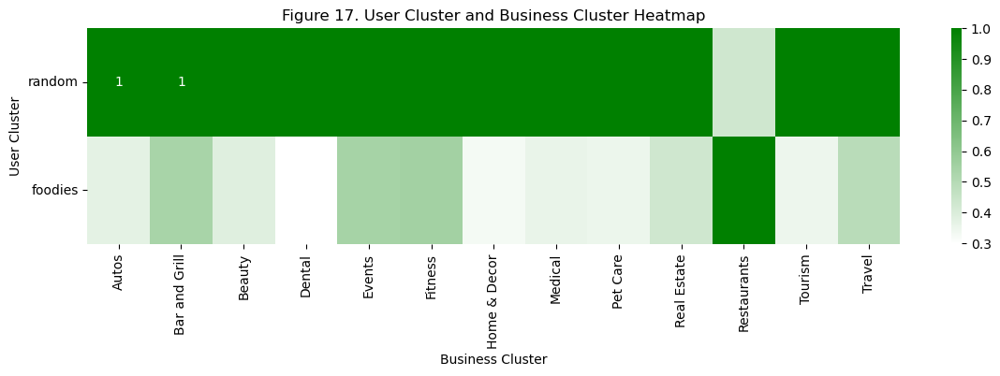

In [53]:
cluster_names = ['random', 'foodies']
title = 'Figure 17. User Cluster and Business Cluster Heatmap'
customer_segment_heatmap(X, y_predict_means, df_counts_norm, cluster_names, title)

Employing k-means clustering with two clusters has resulted in a balanced yet oversimplified categorization of users into 'foodies' and 'random'. The heatmap analysis suggests that a more nuanced segmentation, achieved by ward hierarchical clustering with four user segments, aligns better with the study's objectives.

#
<div style='display: flex; justify-content: space-between; align-items: center; background-color: #001f3f; color: white; padding: 6px; width: 100%;'>
    <h3 style='font-weight: bold; font-size: 25px;'>REFERENCES</h3>
</div>

OpenAI. (2024). Conversation on "Generate Picture of Customers in California" with OpenAI's ChatGPT Personal interview. 01 February 2024.

Yelp Dataset. (2022, March 17). Kaggle. https://www.kaggle.com/datasets/yelp-dataset/yelp-datasetYelp Dataset. (2022, March 17). Kaggle. https://www.kaggle.com/datasets/yelp-dataset/yelp-dataset

California Business Journal. (2021, December 13). The Problem(s) with Yelp - California Business Journal. California Business Journal. https://calbizjournal.com/the-problems-with-yelp/